In [165]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

import os
# For econometrics and regressions
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.tsa.vector_ar.var_model import VAR
from arch import arch_model

# For panel data regressions
from linearmodels import PanelOLS

from sklearn.decomposition import PCA


Index(['Unnamed: 0', '1 Mo', '2 Mo', '3 Mo', '4 Mo', '6 Mo', '1 Yr', '2 Yr',
       '3 Yr', '5 Yr', '7 Yr', '10 Yr', '20 Yr', '30 Yr'],
      dtype='object')
            Level  Slope  Curvature
Price                              
2003-10-10   4.29   3.37       1.09
2003-10-14   4.37   3.44       1.16
2003-10-15   4.43   3.50       1.24
2003-10-16   4.47   3.54       1.40
2003-10-17   4.41   3.48       1.32


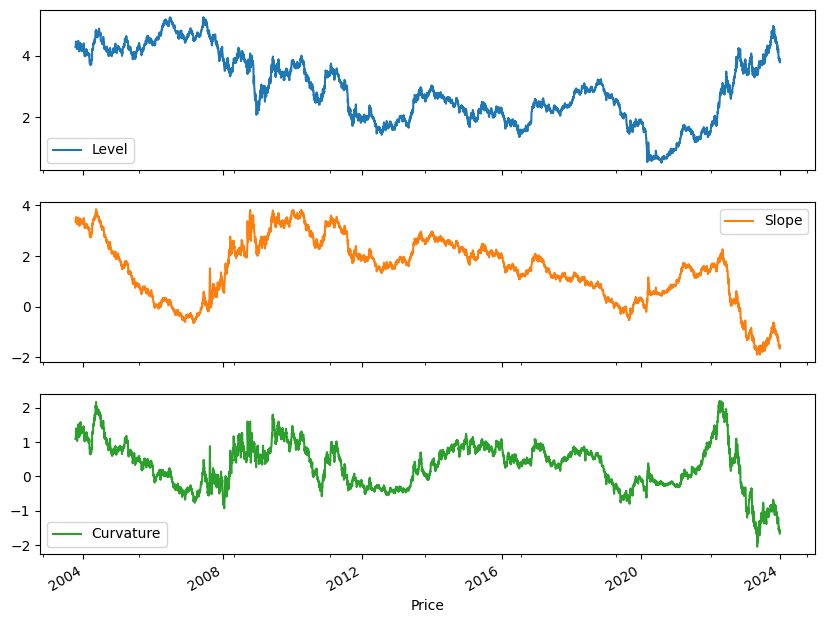

In [166]:
yield_data = pd.read_csv('yield_curve_rates.csv')  # Replace with your actual file name
usd_euro = pd.read_csv('usd_euro.csv')

# Convert 'Date' column to datetime format
yield_data['Price'] = pd.to_datetime(yield_data['Price'])

# Set 'Date' as the index
yield_data.set_index('Price', inplace=True)

# Sort the index if necessary
yield_data.sort_index(inplace=True)

# Define the columns for different maturities
short_term_col = '3 Mo'  # Replace with your column name
medium_term_col = '5 Yr'  # Replace with your column name
long_term_col = '10 Yr'  # Replace with your column name

# Ensure the columns exist
print(yield_data.columns)

# let yield factors be only the columns of interest

# Calculate Level (could be the long-term rate)
yield_data['Level'] = yield_data[long_term_col]

# Calculate Slope (long-term rate minus short-term rate)
yield_data['Slope'] = yield_data[long_term_col] - yield_data[short_term_col]

# Calculate Curvature
yield_data['Curvature'] = (2 * yield_data[medium_term_col]) - yield_data[short_term_col] - yield_data[long_term_col]

# Check the DataFrame
print(yield_data[['Level', 'Slope', 'Curvature']].head())
yield_data[['Level', 'Slope', 'Curvature']].plot(subplots=True, figsize=(10, 8))

yield_factors = yield_data[['Level', 'Slope', 'Curvature']]

In [167]:
import yfinance as yf
# this is something nice that we can now do with the data
import pandas as pd
exchange_rates = pd.DataFrame()
currency_pairs = ['USDEUR=X', 'USDGBP=X', 'USDJPY=X', 'USDCAD=X',
                  'USDCHF=X', 'USDNZD=X', 'USDSEK=X', 'USDNOK=X', 'USDSGD=X']

# first fetch the data from yfinacne from the date 2004-10-10 to 2024-10-10
# for each currency pair
# then save the data to a csv file


# for pair in currency_pairs:
#     data = yf.download(pair, start='2003-10-10', end='2023-10-10')
#     data.to_csv(f'{pair}.csv')

# Load each currency pair data into the DataFrame
for pair in currency_pairs:
    csv_path = f'{pair}.csv'
    data = pd.read_csv(csv_path, parse_dates=['Price'])
    data = data[['Price', 'Adj Close']].rename(columns={'Adj Close': pair})
    if exchange_rates.empty:
        exchange_rates = data
    else:
        exchange_rates = pd.merge(exchange_rates, data, on='Price', how='outer')



# Sort by Date and set Date as the index
exchange_rates.sort_values('Price', inplace=True)
exchange_rates.set_index('Price', inplace=True)

# Display the first few rows
print("Exchange Rates Head:")
print(exchange_rates.head())



Exchange Rates Head:
           USDEUR=X USDGBP=X            USDJPY=X            USDCAD=X  \
Price                                                                  
2003-10-10      NaN      NaN  108.55999755859375    1.32260000705719   
2003-10-13      NaN      NaN   108.9800033569336  1.3214000463485718   
2003-10-14      NaN      NaN  108.79000091552734   1.323199987411499   
2003-10-15      NaN      NaN  109.51000213623047  1.3276000022888184   
2003-10-16      NaN      NaN   109.7699966430664    1.31850004196167   

                      USDCHF=X USDNZD=X USDSEK=X USDNOK=X USDSGD=X  
Price                                                               
2003-10-10  1.3131999969482422      NaN      NaN      NaN      NaN  
2003-10-13  1.3228000402450562      NaN      NaN      NaN      NaN  
2003-10-14  1.3164000511169434      NaN      NaN      NaN      NaN  
2003-10-15  1.3309999704360962      NaN      NaN      NaN      NaN  
2003-10-16  1.3345999717712402      NaN      NaN      NaN   

/var/folders/4v/9yxt9pfj69d_9fx_9c3s2nww0000gn/T/ipykernel_16918/3789404552.py:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data = pd.read_csv(csv_path, parse_dates=['Price'])
/var/folders/4v/9yxt9pfj69d_9fx_9c3s2nww0000gn/T/ipykernel_16918/3789404552.py:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data = pd.read_csv(csv_path, parse_dates=['Price'])
/var/folders/4v/9yxt9pfj69d_9fx_9c3s2nww0000gn/T/ipykernel_16918/3789404552.py:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data = pd.read_csv(csv_path, parse_dates=['Price'])
/var/folders/4v/9yxt9pfj69d_9fx_9c3s2

In [168]:
# remove all nonvalues from the data
# remove all strings from the data


                      USDEUR=X            USDGBP=X            USDJPY=X  \
Price                                                                    
2003-12-01  0.8357700109481812  0.5818700194358826  109.16999816894531   
2003-12-02  0.8271999955177307  0.5779299736022949   108.7300033569336   
2003-12-03  0.8248800039291382  0.5786700248718262  108.30000305175781   
2003-12-04   0.827750027179718  0.5811600089073181   108.2699966430664   
2003-12-05  0.8205500245094299  0.5770000219345093  107.62000274658203   

                      USDCAD=X            USDCHF=X            USDNZD=X  \
Price                                                                    
2003-12-01  1.3042000532150269  1.2980999946594238  1.5520999431610107   
2003-12-02  1.2965999841690063  1.2871999740600586  1.5475000143051147   
2003-12-03  1.3000999689102173  1.2851999998092651  1.5396000146865845   
2003-12-04   1.311400055885315  1.2884999513626099   1.548200011253357   
2003-12-05   1.302899956703186  1.272

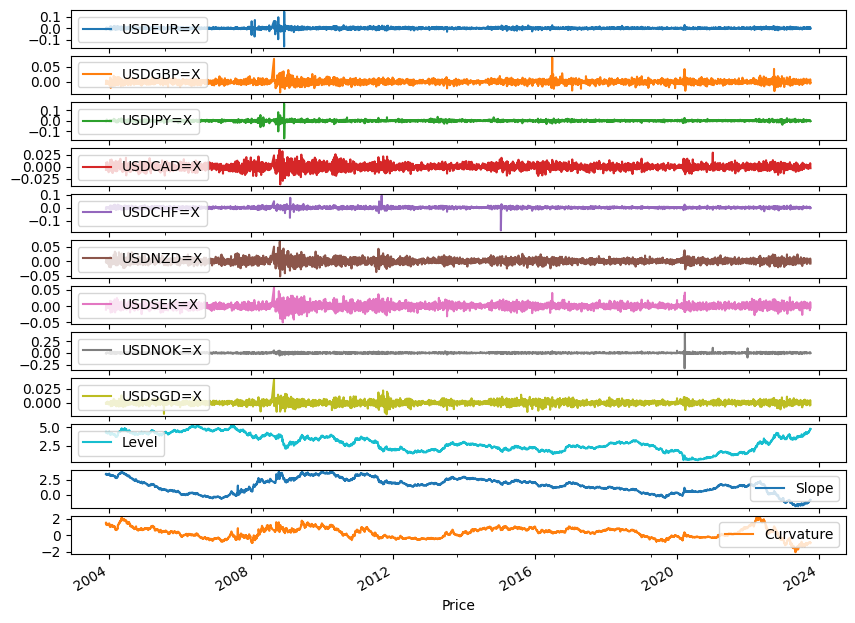

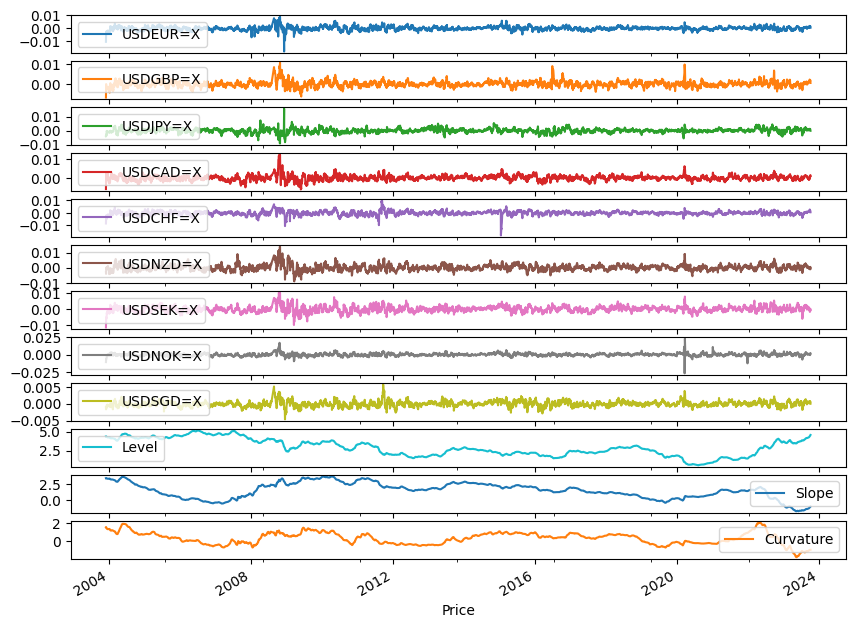

In [169]:
# Merging with the yield curve data
# Ensure both datasets have the same date range
exchange_rates = exchange_rates.dropna()
print(exchange_rates.head())
exchange_rates = exchange_rates.apply(pd.to_numeric, errors='coerce')
exchange_rates = exchange_rates.dropna()

print("\nExchange Rates Head:")

fx_returns = np.log(exchange_rates).diff().dropna()

fx_returns.index = pd.to_datetime(fx_returns.index)
common_dates = fx_returns.index.intersection(yield_factors.index)
# troubleshooting why there are no common dates
# print hte head 

print("\nCommon Dates:")
print(common_dates)


fx_returns = fx_returns.loc[common_dates]
yield_factors = yield_data.loc[common_dates]

# Optionally, check for any remaining NaNs and handle them


# If there are missing values, you can decide to drop or impute them
# For simplicity, we'll drop any rows with NaNs
# print hte length of the data
print(fx_returns.isnull().sum())
print(yield_factors.isnull().sum())

# for yield facqtors, can you get rid of everythign except the level, slope and curvature

yield_factors = yield_factors[['Level', 'Slope', 'Curvature']]
print("\nLength of Data:")
print(len(fx_returns), len(yield_factors))
combined_data = pd.concat([fx_returns, yield_factors], axis=1).dropna()
print("\nLength of Combined Data:")
print(len(combined_data))

# why is combined data 243 vs 4923 items?

combined_data = combined_data[[*currency_pairs, 'Level', 'Slope', 'Curvature']]

# can you make the combined data into EWMA data

# Calculate the exponentially weighted moving average of 17 weeks
combined_data_ewma = combined_data.ewm(span=17).mean()



# set combined_data to be the ewma data
# Plot the original and EWMA data
combined_data.plot(subplots=True, figsize=(10, 8))
combined_data_ewma.plot(subplots=True, figsize=(10, 8))
# combined_data = combined_data_ewma

print("\nCombined Data Head:")
print(combined_data.head())
# first row print 
# drop the non required columns, only having the currencies and the level, slope and curvature
# of the yield curve

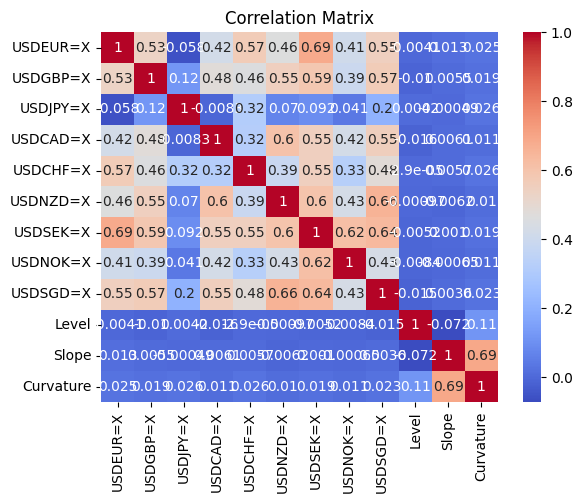

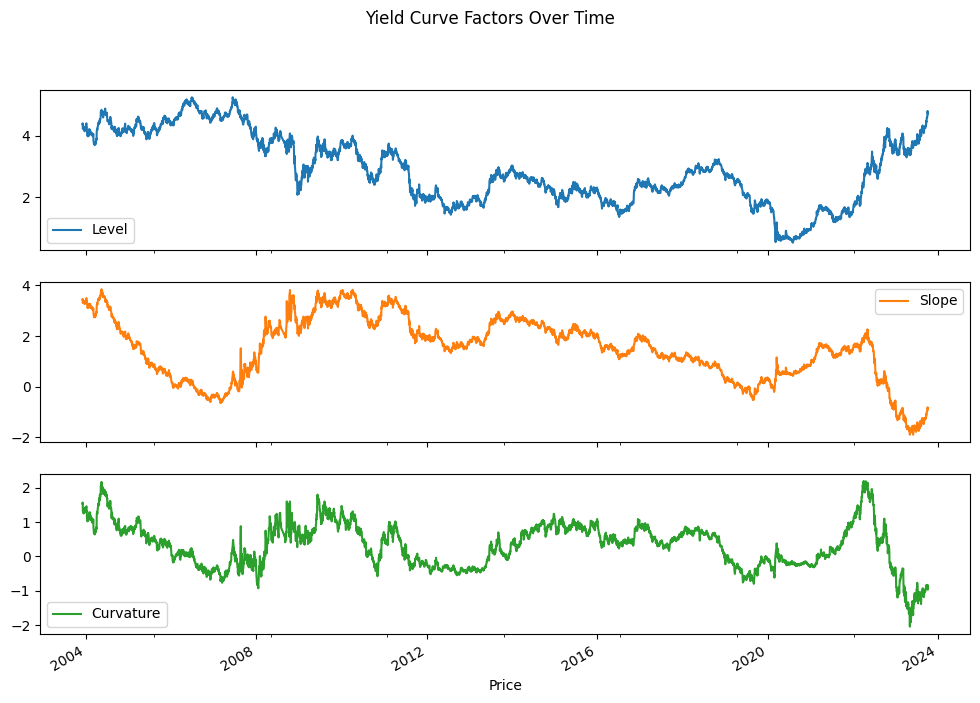

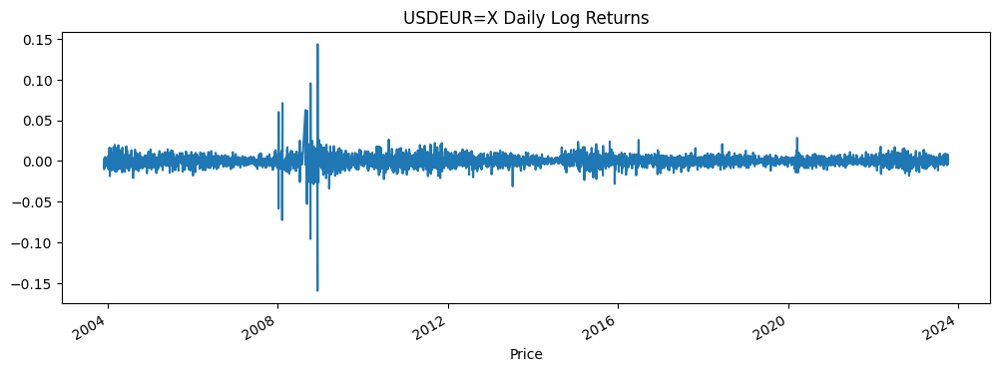

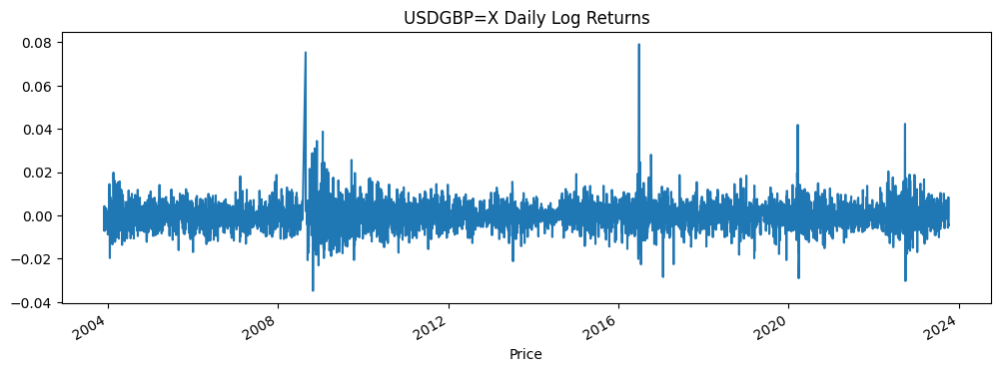

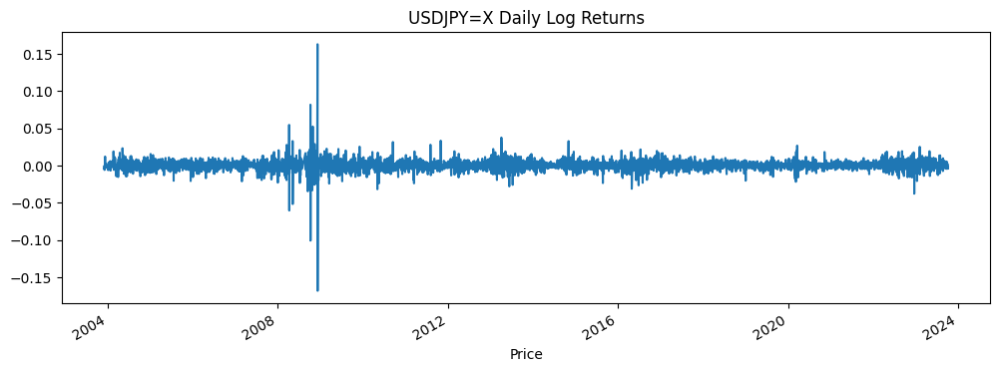

...

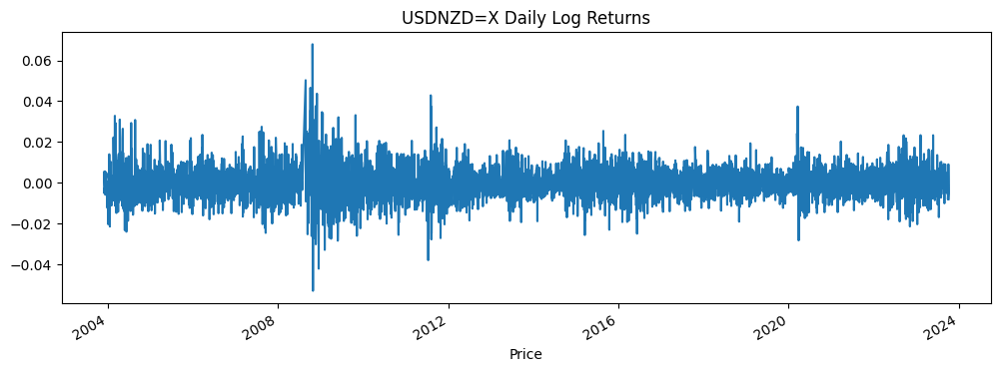

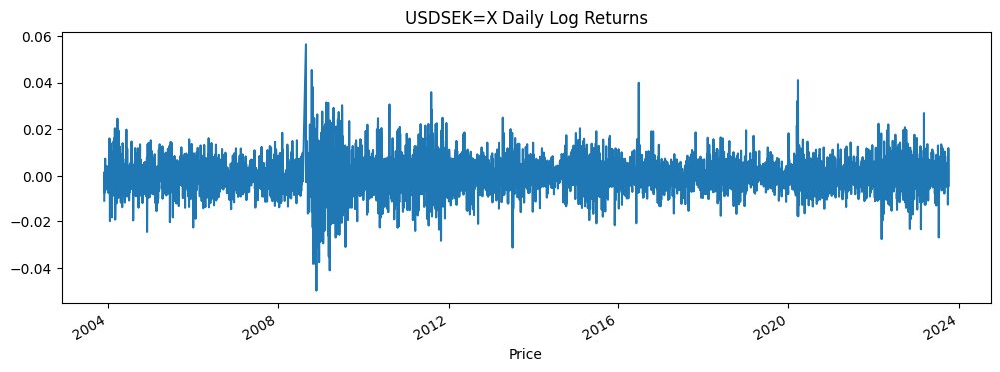

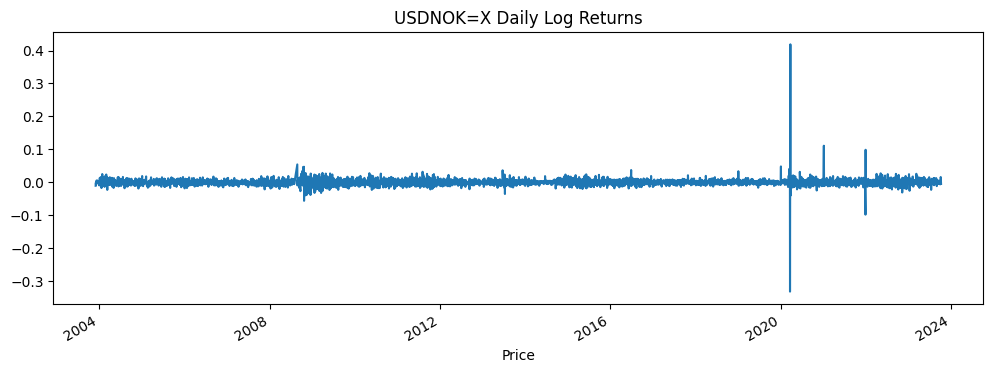

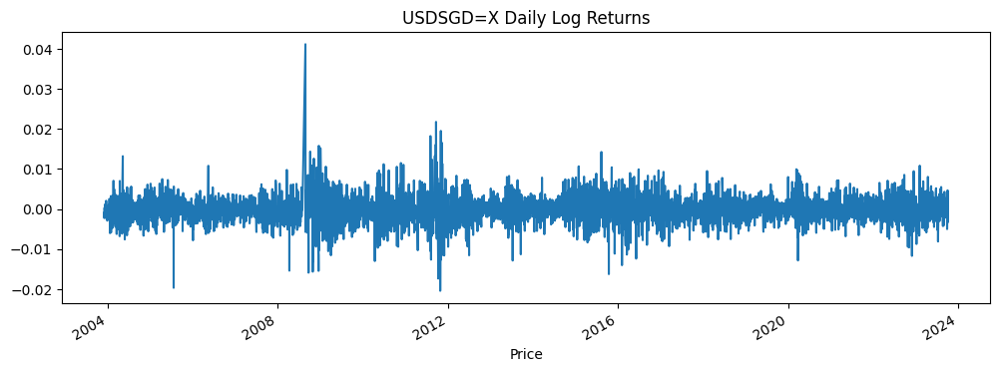

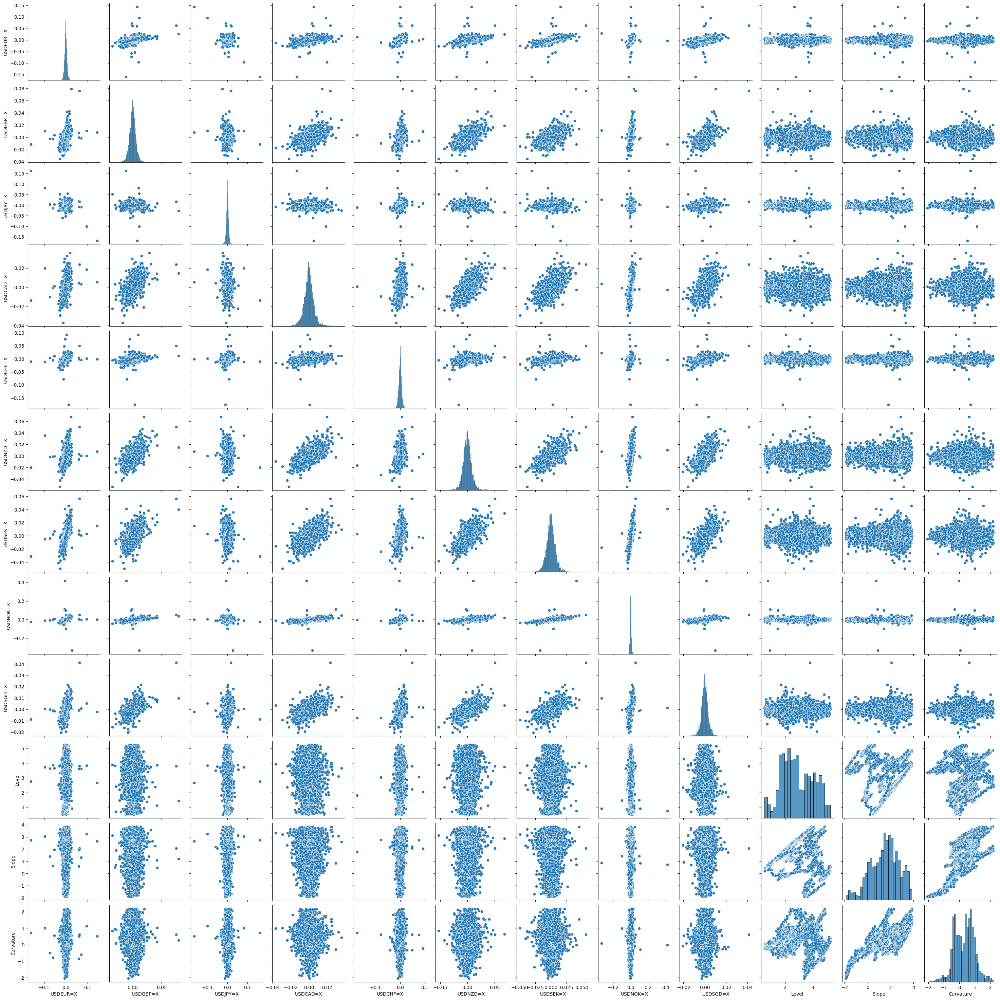


Explained Variance Ratio:
[0.51228862 0.12809008 0.08721609 0.07518725 0.05309724 0.04649967
 0.0390108  0.03283956 0.02577068]


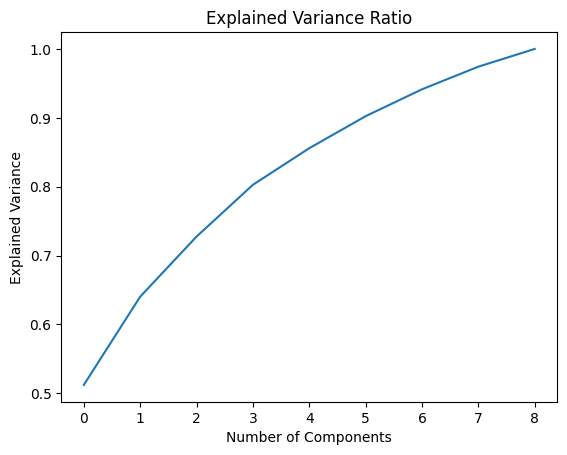

In [170]:
# Exploratory Data Analysis
# Correlation Matrix
correlation_matrix = combined_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()



# Plot Yield Curve Factors
yield_factors.plot(subplots=True, figsize=(12, 8), title='Yield Curve Factors Over Time')
plt.show()

# Plot Forex Returns for a Sample Currency (e.g., EUR)
# fx_returns['USDEUR=X'].plot(figsize=(12, 4), title='USD/EUR Daily Log Returns')

# 
# plot.show()

for pair in currency_pairs:
    combined_data[pair].plot(figsize=(12, 4), title=f'{pair} Daily Log Returns')
    plt.show()

# Pairplot
sns.pairplot(combined_data)
plt.show()

# Principal Component Analysis
# Standardize the data
X = combined_data.drop(['Level', 'Slope', 'Curvature'], axis=1)
X = (X - X.mean()) / X.std()

# Perform PCA
pca = PCA()
pca.fit(X)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("\nExplained Variance Ratio:")
print(explained_variance_ratio)

# Plot the explained variance ratio
plt.plot(np.cumsum(explained_variance_ratio))
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()


In [171]:
# BARRA

exchange_rates.index = pd.to_datetime(exchange_rates.index)
fx_weekly = exchange_rates.resample('W-FRI').last()
fx_weekly_returns = np.log(fx_weekly).diff().dropna()

# Exponential weights:
# half-life = 17 weeks means weight decay per week is: lambda = 0.5^(1/17)
hl = 17
decay = 0.5**(1/hl)

# We create a weighted covariance using exponential weighting:
def exponential_weights(n, decay):
    w = np.array([decay**i for i in range(n)][::-1])
    w = w / w.sum()
    return w

# Compute correlation with exponential weighting:
def exp_weighted_corr(returns, decay):
    """
    Compute exponential weighted correlation matrix for the given returns DataFrame.
    Using last N observations:
    """
    # We use the full sample for now, but only the portion aligning with the daily returns
    common_weekly = fx_weekly_returns.index.intersection(fx_returns.index)
    sample = fx_weekly_returns.loc[common_weekly]
    n = len(sample)
    w = exponential_weights(n, decay)
    # Weighted means
    mean = (sample.T * w).T.sum()
    # Weighted deviations
    dev = sample - mean
    # Weighted covariance
    weighted_cov = (dev.T * w).dot(dev)
    # Weighted variances
    diag = np.sqrt(np.diag(weighted_cov))
    corr = weighted_cov / np.outer(diag, diag)
    return pd.DataFrame(corr, index=sample.columns, columns=sample.columns)

exp_corr_matrix = exp_weighted_corr(fx_weekly_returns, decay)
print("Exponential Weighted Correlation Matrix (Weekly):")
print(exp_corr_matrix)


Exponential Weighted Correlation Matrix (Weekly):
          USDEUR=X  USDGBP=X  USDJPY=X  USDCAD=X  USDCHF=X  USDNZD=X  \
USDEUR=X  1.000000  0.779871  0.535013  0.565254  0.792449  0.701902   
USDGBP=X  0.779871  1.000000  0.575826  0.555174  0.758322  0.735522   
USDJPY=X  0.535013  0.575826  1.000000  0.329062  0.633917  0.562936   
USDCAD=X  0.565254  0.555174  0.329062  1.000000  0.452388  0.677511   
USDCHF=X  0.792449  0.758322  0.633917  0.452388  1.000000  0.631086   
USDNZD=X  0.701902  0.735522  0.562936  0.677511  0.631086  1.000000   
USDSEK=X  0.746116  0.681535  0.536984  0.623172  0.664618  0.785787   
USDNOK=X  0.759913  0.695679  0.518060  0.653580  0.685507  0.731450   
USDSGD=X  0.791922  0.727670  0.756253  0.658599  0.731382  0.821862   

          USDSEK=X  USDNOK=X  USDSGD=X  
USDEUR=X  0.746116  0.759913  0.791922  
USDGBP=X  0.681535  0.695679  0.727670  
USDJPY=X  0.536984  0.518060  0.756253  
USDCAD=X  0.623172  0.653580  0.658599  
USDCHF=X  0.664618  0.68

In [172]:
"""
Barra uses GARCH(1,1) to forecast currency volatilities daily.
We will:
- Fit a GARCH(1,1) model to daily returns for each currency.
- Extract the daily conditional volatilities.
- Check parameters (β, γ).
- If β+γ ≈ 1, consider IGARCH scenario.
"""

garch_params = {}
daily_vols = pd.DataFrame(index=fx_returns_train.index, columns=currency_pairs)
fx_returns_train = train_data[currency_pairs].dropna()
for c in currency_pairs:
    y_c = fx_returns_train[c].dropna()
    # Fit GARCH(1,1)
    garch_model = arch_model(y_c, vol='GARCH', p=1, q=1)
    res = garch_model.fit(disp='off', last_obs=fx_returns.index[-1])
    daily_vols[c] = res.conditional_volatility
    # Store params
    params = res.params
    # In arch_model, typically 'omega', 'alpha[1]' (gamma), 'beta[1]' (beta)
    omega = params['omega']
    alpha = params['alpha[1]'] # gamma
    beta = params['beta[1]']   # beta
    garch_params[c] = {'omega': omega, 'alpha': alpha, 'beta': beta}
    
print("GARCH parameters for each currency:")
for c, p in garch_params.items():
    print(c, p, "alpha+beta=", p['alpha']+p['beta'])

GARCH parameters for each currency:
USDEUR=X {'omega': 1.3398787676921623e-06, 'alpha': 0.05, 'beta': 0.9299999999999999} alpha+beta= 0.98
USDGBP=X {'omega': 7.701953405540659e-07, 'alpha': 0.050000014420348134, 'beta': 0.929999991799394} alpha+beta= 0.9800000062197421
USDJPY=X {'omega': 1.3406467742555437e-06, 'alpha': 0.09976555249483911, 'beta': 0.8802785530525822} alpha+beta= 0.9800441055474213
USDCAD=X {'omega': 7.171044832356258e-07, 'alpha': 0.05, 'beta': 0.9299999999999999} alpha+beta= 0.98
USDCHF=X {'omega': 1.1673429494604747e-06, 'alpha': 0.05, 'beta': 0.9299999999999999} alpha+beta= 0.98
USDNZD=X {'omega': 1.4579286733133226e-06, 'alpha': 0.04999993668617485, 'beta': 0.9299985509027707} alpha+beta= 0.9799984875889456
USDSEK=X {'omega': 1.3014747265672787e-06, 'alpha': 0.049999999310773445, 'beta': 0.929999987180386} alpha+beta= 0.9799999864911595
USDNOK=X {'omega': 1.3054106346460048e-06, 'alpha': 0.04999941440647753, 'beta': 0.9299890623639968} alpha+beta= 0.97998847677047

/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.699e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 3.851e-05. Parameter
estimation work better when this value is between 1 and 1000. Th

Last Day's Volatility:
Example of Monthly-scaled Vol (simple approximation):
USDEUR=X    0.023820
USDGBP=X    2.414888
USDJPY=X    0.018893
USDCAD=X    0.021002
USDCHF=X    0.021589
USDNZD=X    3.124321
USDSEK=X    0.027626
USDNOK=X    4.774027
USDSGD=X    0.010737
Name: 2017-12-29 00:00:00, dtype: float64
Final Barra-Style Covariance Matrix:
          USDEUR=X  USDGBP=X  USDJPY=X  USDCAD=X  USDCHF=X   USDNZD=X  \
USDEUR=X  0.000567  0.044860  0.000241  0.000283  0.000408   0.052236   
USDGBP=X  0.044860  5.831685  0.026272  0.028157  0.039535   5.549428   
USDJPY=X  0.000241  0.026272  0.000357  0.000131  0.000259   0.033229   
USDCAD=X  0.000283  0.028157  0.000131  0.000441  0.000205   0.044457   
USDCHF=X  0.000408  0.039535  0.000259  0.000205  0.000466   0.042567   
USDNZD=X  0.052236  5.549428  0.033229  0.044457  0.042567   9.761383   
USDSEK=X  0.000491  0.045468  0.000280  0.000362  0.000396   0.067824   
USDNOK=X  0.086414  8.020302  0.046727  0.065531  0.070652  10.910011  

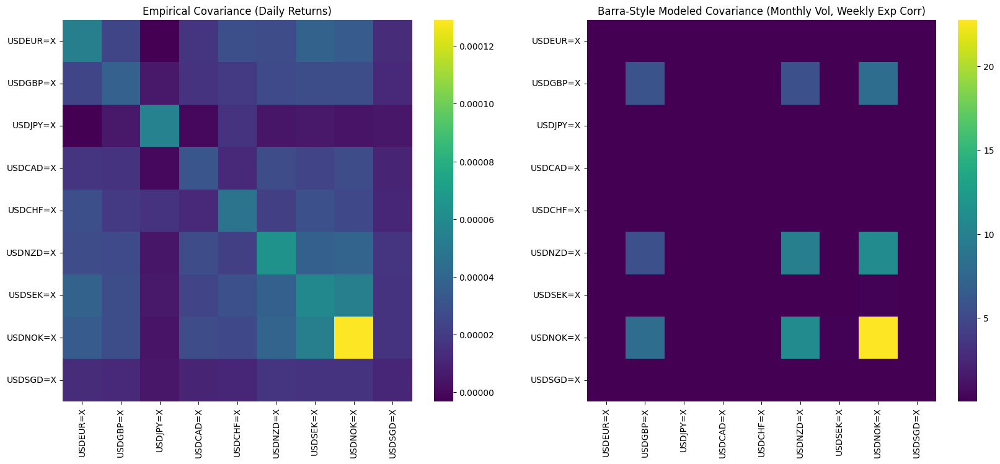

Exponential Weighted Correlation Matrix (Weekly):


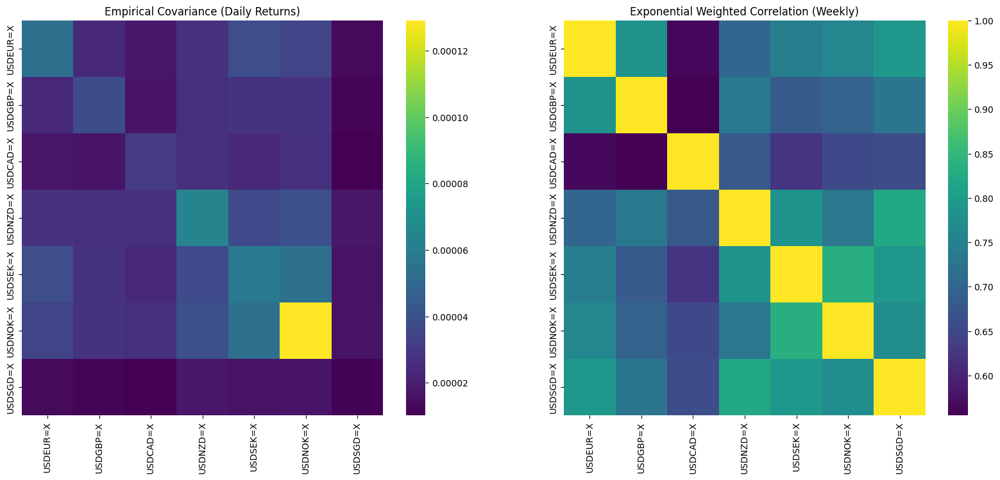

          USDEUR=X  USDGBP=X  USDJPY=X  USDCAD=X  USDCHF=X  USDNZD=X  \
USDEUR=X  1.000000  0.779871  0.535013  0.565254  0.792449  0.701902   
USDGBP=X  0.779871  1.000000  0.575826  0.555174  0.758322  0.735522   
USDJPY=X  0.535013  0.575826  1.000000  0.329062  0.633917  0.562936   
USDCAD=X  0.565254  0.555174  0.329062  1.000000  0.452388  0.677511   
USDCHF=X  0.792449  0.758322  0.633917  0.452388  1.000000  0.631086   
USDNZD=X  0.701902  0.735522  0.562936  0.677511  0.631086  1.000000   
USDSEK=X  0.746116  0.681535  0.536984  0.623172  0.664618  0.785787   
USDNOK=X  0.759913  0.695679  0.518060  0.653580  0.685507  0.731450   
USDSGD=X  0.791922  0.727670  0.756253  0.658599  0.731382  0.821862   

          USDSEK=X  USDNOK=X  USDSGD=X  
USDEUR=X  0.746116  0.759913  0.791922  
USDGBP=X  0.681535  0.695679  0.727670  
USDJPY=X  0.536984  0.518060  0.756253  
USDCAD=X  0.623172  0.653580  0.658599  
USDCHF=X  0.664618  0.685507  0.731382  
USDNZD=X  0.785787  0.731450  0.8

In [173]:
"""
Barra suggests scaling daily volatility to a monthly horizon (about 20 business days).
For GARCH(1,1):
- If forecast variance for one period ahead is σ²_t+1:
- For n steps ahead, we account for mean reversion and persistence.

If β+γ < 1:
    multi-period variance forecast approaches n*ω² in the long run.

For simplicity, demonstrate scaling last day's volatility to monthly:
We approximate monthly vol as sqrt(20)*daily_vol.

For a more correct Barra approach:
- They use an aggregation formula with GARCH parameters. 
- We'll illustrate a simplified version due to complexity.

"""
days_per_month = 20
# drop na
daily_vols = daily_vols.dropna()
last_day_vol = daily_vols.iloc[-1]
# skip NANs 

print("Last Day's Volatility:")
monthly_vol_estimate = last_day_vol * np.sqrt(days_per_month)
print("Example of Monthly-scaled Vol (simple approximation):")
print(monthly_vol_estimate)

# For a more exact approach:
# GARCH(1,1) n-step forecast = ω²*(1 - (α+β)^{n})/(1-(α+β)) + (α+β)^{n} * σ²_t (if needed)
# We'll leave this as conceptual, due to complexity of full multi-step forecast here.

#-------------------------#
# Constructing the Full Covariance Matrix
# Using Barra Logic:
# Cov = D * Corr * D, where D is diagonal of monthly vols
#-------------------------#
# We now combine the exponential weighted correlation (weekly) and daily-based volatility estimates.
# We use the last day's GARCH vol as a proxy for current volatility and scale it to monthly.

D = np.diag(monthly_vol_estimate.values)
final_cov = D.dot(exp_corr_matrix.loc[currency_pairs, currency_pairs].values).dot(D)
final_cov_df = pd.DataFrame(final_cov, index=currency_pairs, columns=currency_pairs)

print("Final Barra-Style Covariance Matrix:")
print(final_cov_df)

fig, axes = plt.subplots(1,2, figsize=(20,8))
sns.heatmap(empirical_cov := fx_returns[currency_pairs].cov(), annot=False, ax=axes[0], cmap='viridis')
axes[0].set_title('Empirical Covariance (Daily Returns)')
sns.heatmap(final_cov_df, annot=False, ax=axes[1], cmap='viridis')
axes[1].set_title('Barra-Style Modeled Covariance (Monthly Vol, Weekly Exp Corr)')
plt.show()


# removing chf and jpy and replotting 

currency_pairs2 = ['USDEUR=X', 'USDGBP=X', 'USDCAD=X',
                    'USDNZD=X', 'USDSEK=X', 'USDNOK=X', 'USDSGD=X']


exp_corr_matrix = exp_weighted_corr(fx_weekly_returns, decay)
print(f
fig, axes = plt.subplots(1,2, figsize=(20,8))
sns.heatmap(empirical_cov := fx_returns[currency_pairs2].cov(), annot=False, ax=axes[0], cmap='viridis')
axes[0].set_title('Empirical Covariance (Daily Returns)')
sns.heatmap(exp_corr_matrix.loc[currency_pairs2, currency_pairs2], annot=False, ax=axes[1], cmap='viridis')
axes[1].set_title('Exponential Weighted Correlation (Weekly)')
plt.show()
print(exp_corr_matrix)


#-------------------------#
# IGARCH Consideration
#-------------------------#
"""
If α+β = 1 (or very close to 1), the GARCH model reduces to IGARCH.
For such currencies, there's no unconditional variance; variance forecasts depend heavily on recent shocks.
If we detect α+β ~ 1 for a currency, we mention it and consider an IGARCH approach.
"""
for c, p in garch_params.items():
    if abs((p['alpha']+p['beta']) - 1) < 0.01:
        print(f"{c} appears to be IGARCH-like (alpha+beta ≈ 1). In such a case, long-term variance does not revert.")


In [174]:
# Extract yield factors
yield_factors_diff = combined_data[['Level', 'Slope', 'Curvature']]

# Extract forex returns
fx_returns_only = combined_data[currency_pairs]

# Compute pairwise correlations between forex returns and yield factors
correlations = fx_returns_only.corrwith(yield_factors_diff['Level']).to_frame(name='Level')
correlations['Slope'] = fx_returns_only.corrwith(yield_factors_diff['Slope'])
correlations['Curvature'] = fx_returns_only.corrwith(yield_factors_diff['Curvature'])

print("\nCorrelations between Forex Returns and Yield Curve Factors:")
print(correlations)


Correlations between Forex Returns and Yield Curve Factors:
             Level     Slope  Curvature
USDEUR=X -0.004098  0.013107   0.025058
USDGBP=X -0.010249  0.005501   0.018896
USDJPY=X  0.004150 -0.000491   0.026390
USDCAD=X -0.015690  0.006111   0.010529
USDCHF=X -0.000029  0.005733   0.026420
USDNZD=X -0.000969 -0.006198   0.010373
USDSEK=X -0.005203  0.001005   0.018898
USDNOK=X -0.008434 -0.000647   0.010811
USDSGD=X -0.014700  0.003617   0.022909


In [175]:
# Initialize DataFrames to store betas and alphas
betas = pd.DataFrame(index=currency_pairs, columns=['beta_Level','beta_Slope','beta_Curvature'])
betas = betas.astype(float)

# betas = pd.DataFrame(index=range(1, 23), columns=range(1, 23), dtype=float)
alphas = pd.Series(index=currency_pairs)

# Perform regression for each currency
for c in currency_pairs:
    y = combined_data[c]
    X = combined_data[['Level','Slope','Curvature']]
    X = sm.add_constant(X)  # Adds a constant term to the model
    model = sm.OLS(y, X).fit()
    alphas[c] = model.params['const']
    betas.loc[c,'beta_Level'] = model.params['Level']
    betas.loc[c,'beta_Slope'] = model.params['Slope']
    betas.loc[c,'beta_Curvature'] = model.params['Curvature']
    print(model.summary())

print("\nEstimated Betas:")
print(betas)

import yfinance as yf
# adding S&P 500 returns as a macro factor
sp500 = yf.download('^GSPC', start='2003-10-10', end='2023-10-10')['Adj Close']
sp500_returns = np.log(sp500).diff().dropna()
sp500_returns.name = 'SP500'

# Align data frequencies and indices
common_index = combined_data.index.intersection(sp500_returns.index)

full_data = pd.concat([combined_data.loc[common_index], sp500_returns.loc[common_index]], axis=1).dropna()

# Now you can test if adding the SP500 factor improves the regressions
X = full_data[['Level','Slope','Curvature','^GSPC']]
y = full_data['USDEUR=X']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print(model.summary())

[*********************100%***********************]  1 of 1 completed

                            OLS Regression Results                            
Dep. Variable:               USDEUR=X   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.202
Date:                Mon, 09 Dec 2024   Prob (F-statistic):              0.307
Time:                        21:03:04   Log-Likelihood:                 17216.
No. Observations:                4919   AIC:                        -3.442e+04
Df Residuals:                    4915   BIC:                        -3.440e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0001      0.000      0.397      0.6

In [176]:
# Extract factor returns
factor_returns = combined_data[['Level','Slope','Curvature']]

# Compute covariance matrix
factor_cov = factor_returns.cov()
print("\nFactor Covariance Matrix:")
print(factor_cov)


Factor Covariance Matrix:
              Level     Slope  Curvature
Level      1.260560 -0.098676   0.083737
Slope     -0.098676  1.499867   0.549909
Curvature  0.083737  0.549909   0.421958


In [177]:
# Initialize a DataFrame to store residuals
residuals = pd.DataFrame(index=combined_data.index, columns=currency_pairs)

# Calculate residuals for each currency
for c in currency_pairs:
    y = combined_data[c]
    X = combined_data[['Level','Slope','Curvature']]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    residuals[c] = model.resid

# Compute residual covariance matrix
resid_cov = residuals.cov()
print("\nResidual Covariance Matrix:")
print(resid_cov)


Residual Covariance Matrix:
          USDEUR=X  USDGBP=X      USDJPY=X      USDCAD=X  USDCHF=X  USDNZD=X  \
USDEUR=X  0.000053  0.000024 -3.218345e-06  1.717233e-05  0.000028  0.000027   
USDGBP=X  0.000024  0.000037  5.384865e-06  1.620925e-05  0.000019  0.000027   
USDJPY=X -0.000003  0.000005  5.503342e-05 -3.581599e-07  0.000016  0.000004   
USDCAD=X  0.000017  0.000016 -3.581599e-07  3.104454e-05  0.000012  0.000027   
USDCHF=X  0.000028  0.000019  1.603468e-05  1.215617e-05  0.000047  0.000021   
USDNZD=X  0.000027  0.000027  4.081713e-06  2.680444e-05  0.000021  0.000064   
USDSEK=X  0.000038  0.000027  5.200902e-06  2.338396e-05  0.000029  0.000037   
USDNOK=X  0.000034  0.000027  3.404630e-06  2.674585e-05  0.000026  0.000039   
USDSGD=X  0.000013  0.000011  5.026221e-06  1.021877e-05  0.000011  0.000017   

          USDSEK=X  USDNOK=X  USDSGD=X  
USDEUR=X  0.000038  0.000034  0.000013  
USDGBP=X  0.000027  0.000027  0.000011  
USDJPY=X  0.000005  0.000003  0.000005  
USDCAD

In [178]:
# Convert betas to numpy array
B = betas[['beta_Level','beta_Slope','beta_Curvature']].values

# Factor covariance matrix as numpy array
F = factor_cov.values

# Residual covariance matrix as numpy array
Sigma_e = resid_cov.values

# Compute modeled covariance matrix: B * F * B' + Sigma_e
modelled_cov = np.dot(np.dot(B, F), B.T) + Sigma_e

# Convert to DataFrame for readability
modelled_cov_df = pd.DataFrame(modelled_cov, index=currency_pairs, columns=currency_pairs)

# Ensure all entries in modelled_cov_df are floats
modelled_cov_df = modelled_cov_df.astype(float)


print("\nModeled FX Covariance Matrix via Factor Model:")
print(modelled_cov_df)


Modeled FX Covariance Matrix via Factor Model:
          USDEUR=X  USDGBP=X      USDJPY=X      USDCAD=X  USDCHF=X  USDNZD=X  \
USDEUR=X  0.000053  0.000024 -3.172221e-06  1.718957e-05  0.000028  0.000027   
USDGBP=X  0.000024  0.000037  5.422709e-06  1.622565e-05  0.000019  0.000027   
USDJPY=X -0.000003  0.000005  5.510992e-05 -3.416797e-07  0.000016  0.000004   
USDCAD=X  0.000017  0.000016 -3.416797e-07  3.105785e-05  0.000012  0.000027   
USDCHF=X  0.000028  0.000019  1.609478e-05  1.217259e-05  0.000047  0.000021   
USDNZD=X  0.000027  0.000027  4.128009e-06  2.681553e-05  0.000021  0.000064   
USDSEK=X  0.000038  0.000027  5.256691e-06  2.340209e-05  0.000029  0.000037   
USDNOK=X  0.000034  0.000027  3.457832e-06  2.676810e-05  0.000026  0.000039   
USDSGD=X  0.000013  0.000011  5.054315e-06  1.023081e-05  0.000011  0.000017   

          USDSEK=X  USDNOK=X  USDSGD=X  
USDEUR=X  0.000038  0.000034  0.000013  
USDGBP=X  0.000027  0.000027  0.000011  
USDJPY=X  0.000005  0.000003

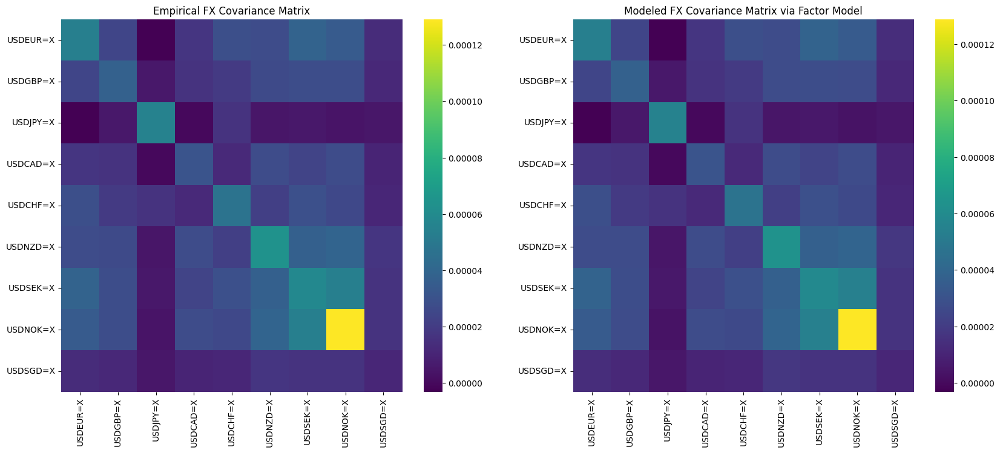

In [179]:
# Compute empirical covariance matrix
empirical_cov = fx_returns.cov()

# Plot heatmaps side by side for comparison
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(empirical_cov, annot=False, cmap='viridis', ax=axes[0])
axes[0].set_title('Empirical FX Covariance Matrix')

sns.heatmap(modelled_cov_df, annot=False, cmap='viridis', ax=axes[1])
axes[1].set_title('Modeled FX Covariance Matrix via Factor Model')

plt.show()

In [180]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from arch import arch_model
from sklearn.metrics import mean_squared_error
import math

# Assume combined_data, fx_returns, exchange_rates, currency_pairs, and exp_weighted_corr function are already defined

#########################################
# 1. Define Train-Test Split
#########################################
split_date = '2018-01-01'  # Adjust as needed
train_data = combined_data.loc[:split_date]
test_data = combined_data.loc[split_date:]

fx_returns_train = train_data[currency_pairs].dropna()
fx_returns_test = test_data[currency_pairs].dropna()

#########################################
# 2. Fit GARCH Models on Training Data
#########################################
garch_params = {}
daily_vols = pd.DataFrame(index=fx_returns_train.index, columns=currency_pairs)

for c in currency_pairs:
    y_c = fx_returns_train[c].dropna()
    garch_model = arch_model(y_c, vol='GARCH', p=1, q=1)
    res = garch_model.fit(disp='off', last_obs=fx_returns_train.index[-1])
    daily_vols[c] = res.conditional_volatility
    
    params = 
    omega = params['omega']
    alpha = params['alpha[1]']
    beta = params['beta[1]']
    garch_params[c] = {'omega': omega, 'alpha': alpha, 'beta': beta}

print("GARCH parameters (Train Data):")
for c, p in garch_params.items():
    print(f"{c}: {p}, alpha+beta={p['alpha']+p['beta']:.3f}")

# IGARCH check
for c, p in garch_params.items():
    if abs((p['alpha']+p['beta']) - 1) < 0.01:
        print(f"{c} appears IGARCH-like (alpha+beta≈1) - long-term variance does not revert.")

#########################################
# 3. Scale Volatilities and Compute Covariance (Train Data)
#########################################
days_per_month = 20
daily_vols = daily_vols.dropna()
last_day_vol_train = daily_vols.iloc[-1]
monthly_vol_estimate = last_day_vol_train * np.sqrt(days_per_month)

fx_weekly_train = exchange_rates.loc[train_data.index].resample('W-FRI').last()
fx_weekly_returns_train = np.log(fx_weekly_train).diff().dropna()

hl = 17
decay = 0.5**(1/hl)

def exponential_weights(n, decay):
    w = np.array([decay**i for i in range(n)][::-1])
    return w / w.sum()

def exp_weighted_corr(returns, decay):
    sample = returns.copy()
    n = len(sample)
    w = exponential_weights(n, decay)
    mean = (sample.T * w).T.sum()
    dev = sample - mean
    weighted_cov = (dev.T * w).dot(dev)
    diag = np.sqrt(np.diag(weighted_cov))
    corr = weighted_cov / np.outer(diag, diag)
    return pd.DataFrame(corr, index=sample.columns, columns=sample.columns)

# Align fx_weekly_returns to training period
fx_weekly_returns_train = fx_weekly_returns_train.loc[fx_weekly_returns_train.index <= fx_returns_train.index[-1]]
exp_corr_matrix_train = exp_weighted_corr(fx_weekly_returns_train[currency_pairs], decay)

D = np.diag(monthly_vol_estimate.values)
final_cov = D @ exp_corr_matrix_train.loc[currency_pairs, currency_pairs].values @ D
final_cov_df = pd.DataFrame(final_cov, index=currency_pairs, columns=currency_pairs)

print("Final Barra-Style Covariance Matrix (Train-based):")
print(final_cov_df)

empirical_cov_train = fx_returns_train[currency_pairs].cov()

fig, axes = plt.subplots(1,2, figsize=(20,8))
sns.heatmap(empirical_cov_train, annot=False, ax=axes[0], cmap='viridis')
axes[0].set_title('Empirical Covariance (Train Data)')
sns.heatmap(final_cov_df, annot=False, ax=axes[1], cmap='viridis')
axes[1].set_title('Barra-Style Covariance (Train Data)')
plt.show()

# try it, but also removign sgd
currency_pairs2 = ['USDEUR=X', 'USDGBP=X', 'USDCAD=X',
                    'USDNZD=X', 'USDSEK=X', 'USDNOK=X']

exp_corr_matrix_train = exp_weighted_corr(fx_weekly_returns_train, decay)
print("Exponential Weighted Correlation Matrix (Weekly) without sgd:")
fig, axes = plt.subplots(1,2, figsize=(20,8))
sns.heatmap(empirical_cov_train := fx_returns_train[currency_pairs2].cov(), annot=False, ax=axes[0], cmap='viridis')
axes[0].set_title('Empirical Covariance (Daily Returns)')
sns.heatmap(exp_corr_matrix_train.loc[currency_pairs2, currency_pairs2], annot=False, ax=axes[1], cmap='viridis')
axes[1].set_title('Exponential Weighted Correlation (Weekly)')
plt.show()

#########################################
# 4. Out-of-Sample Evaluation on Test Data
#########################################
# Example: Evaluate forecasts for USD/EUR
# turn into loop for all currencies
for c in currency_pairs:
    target_currency = c
    y_test = np.log(exchange_rates[target_currency]).diff().dropna().loc[test_data.index]

    # Rolling one-step-ahead forecast:
    prediction_horizon = 1
    predicted_vol_series = []

    print(y_test.index)


    # drop the date ('2021-06-29')) from the index
    y_test = y_test.drop('2021-06-29')
    y_test = y_test.drop('2021-06-30')
    for date in y_test.index:
        subset = np.log(exchange_rates[target_currency]).diff().dropna().loc[:date]
        subset = subset.iloc[:-1]  # ensure we're forecasting out-of-sample
        if len(subset) < 200:
            continue  # not enough data to fit GARCH reliably

        model = arch_model(subset, vol='GARCH', p=1, q=1)
        res = model.fit(disp='off')

        # One-step ahead forecast without specifying start
        forecast = res.forecast(horizon=1, reindex=False)
        
        # Check if forecast is empty
        if forecast.variance.values.size == 0:
            print(f"No forecast available for {date}, skipping.")
            continue
        vol_forecast = np.sqrt(forecast.variance.values[-1,0])
        predicted_vol_series.append((date, vol_forecast))

    predicted_vol_df = pd.DataFrame(predicted_vol_series, columns=['Date','Predicted_Vol']).set_index('Date')
    outliers = predicted_vol_df[predicted_vol_df['Predicted_Vol'] > 0.1]  # or another suitable threshold
    print(outliers)

    # Compute realized volatility as rolling STD of returns in the test set
    realized_vol = y_test.rolling(window=30).std()

    # Align indexes
    common_index = realized_vol.index.intersection(predicted_vol_df.index)
    realized_vol = realized_vol.loc[common_index]
    predicted_vol_df = predicted_vol_df.loc[common_index]

    # Evaluate Performance
    corr = realized_vol.corr(predicted_vol_df['Predicted_Vol'])
    rmse = math.sqrt(mean_squared_error(realized_vol.dropna(), predicted_vol_df.loc[realized_vol.dropna().index, 'Predicted_Vol']))

    # Plot out-of-sample comparison
    plt.figure(figsize=(12,6))
    plt.plot(realized_vol, label='Realized Vol (30-day rolling STD)')
    plt.plot(predicted_vol_df['Predicted_Vol'], label='Predicted Vol (GARCH)', alpha=0.7)
    plt.title(f'Out-of-Sample Volatility Prediction: {target_currency}\nCorr: {corr:.4f}, RMSE: {rmse:.6f}')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()


    print(f"Out-of-Sample Evaluation for {target_currency}:")
    print(f"Correlation between realized and predicted vol: {corr:.4f}")
    print(f"RMSE: {rmse:.6f}")
#########################################
# Notes on Further Evaluations
#########################################
# - You can repeat the out-of-sample evaluation step for other currencies.
# - Consider testing different rolling windows or model variants (EGARCH, GJR-GARCH) to improve forecasts.
# - Implementing a more rigorous backtesting framework can further validate the model's predictive ability.

SyntaxError: invalid syntax (1259526330.py, line 33)

In [136]:
# Flatten the covariance matrices
empirical_flat = empirical_cov.values.flatten()
modelled_flat = modelled_cov_df.values.flatten()

# Compute Pearson correlation
pearson_corr = np.corrcoef(empirical_flat, modelled_flat)[0,1]
print(f"\nPearson Correlation between Empirical and Modeled Covariance Matrices: {pearson_corr:.4f}")


Pearson Correlation between Empirical and Modeled Covariance Matrices: 1.0000


                     Constant Mean - GARCH Model Results                      
Dep. Variable:               USDEUR=X   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                18327.9
Distribution:                  Normal   AIC:                          -36647.7
Method:            Maximum Likelihood   BIC:                          -36621.7
                                        No. Observations:                 4923
Date:                Mon, Dec 09 2024   Df Residuals:                     4922
Time:                        19:44:06   Df Model:                            1
                                  Mean Model                                  
                  coef    std err          t      P>|t|       95.0% Conf. Int.
------------------------------------------------------------------------------
mu         -3.7325e-06  2.114e-05     -0.177      0.

/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 5.343e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


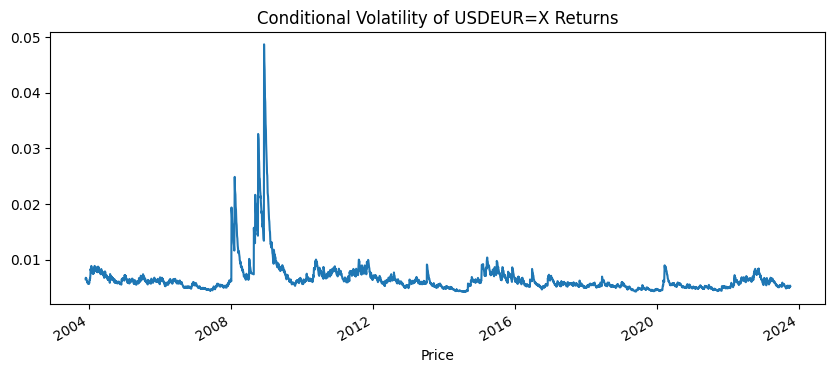

In [ ]:
# Utilizing garch

from arch import arch_model

# Select a sample currency return (e.g., EUR/USD)
y = fx_returns['USDEUR=X'].dropna()

# Fit a GARCH(1,1) model
garch_model = arch_model(y, vol='GARCH', p=1, q=1)
garch_res = garch_model.fit(disp='off')
print(garch_res.summary())

# Plot conditional volatility
garch_res.conditional_volatility.plot(figsize=(10, 4), title="Conditional Volatility of USDEUR=X Returns")
plt.show()


In [138]:
# # Idea: Instead of a single static regression for factor loadings, run a rolling window regression to see how betas evolve over time. This gives insight into regime changes.

# # Code Snippet:

# window_size = 252  # e.g., use a 1-year rolling window (assuming ~252 trading days)
# betas_rolling = {c: [] for c in currency_pairs}
# dates = []

# for start_idx in range(len(combined_data) - window_size):
#     end_idx = start_idx + window_size
#     window_data = combined_data.iloc[start_idx:end_idx]
#     X = window_data[['Level','Slope','Curvature']]
#     X = sm.add_constant(X)
    
#     for c in currency_pairs:
#         y = window_data[c]
#         model = sm.OLS(y, X).fit()
#         if start_idx == 0:
#             dates.append(window_data.index[-1])
#         betas_rolling[c].append([model.params['Level'], model.params['Slope'], model.params['Curvature']])

# # Convert to DataFrame
# betas_rolling_df = {}
# for c in currency_pairs:
#     betas_rolling_df[c] = pd.DataFrame(betas_rolling[c], index=dates, columns=['beta_Level','beta_Slope','beta_Curvature'])

# # Example: Plot the time series of betas for USDEUR=X
# betas_rolling_df['USDEUR=X'].plot(subplots=True, figsize=(10,8), title='Rolling Betas for USDEUR=X')
# plt.show()


/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 5.343e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 3.728e-05. Parameter
estimation work better when this value is between 1 and 1000. Th

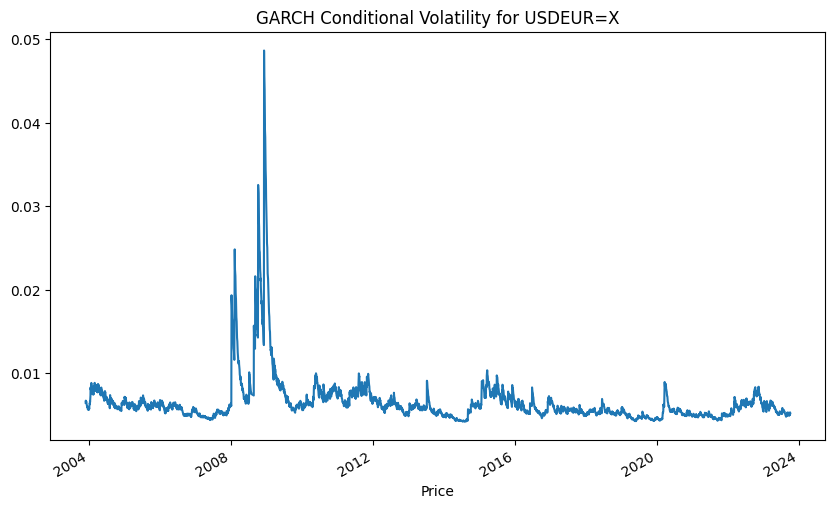

In [ ]:
# Convert daily returns to weekly returns
# Convert daily returns to weekly returns (summed or averaged, depending on your preference)
weekly_returns = fx_returns.resample('W').mean()

# Function to calculate exponentially weighted correlation
def exponentially_weighted_correlation(data, half_life):
    weights = np.exp(-np.log(2) / half_life * np.arange(len(data)))
    weights /= weights.sum()
    weighted_corrs = data.mul(weights, axis=0).corr()
    return weighted_corrs

# Compute exponentially weighted correlation matrix over rolling windows
half_life = 17
rolling_window = 17  # Use 17 weeks as the rolling window size
rolling_correlations = []

for i in range(rolling_window, len(weekly_returns)):
    window_data = weekly_returns.iloc[i - rolling_window:i]
    ew_corr = exponentially_weighted_correlation(window_data, half_life)
    rolling_correlations.append((weekly_returns.index[i], ew_corr))

# Create a dictionary of time-varying correlations
rolling_correlations_dict = {date: corr for date, corr in rolling_correlations}

from arch import arch_model

# Initialize a DataFrame to store GARCH volatilities
garch_vols = pd.DataFrame(index=fx_returns.index)

# Fit GARCH(1,1) to each currency's daily returns
for currency in fx_returns.columns:
    model = arch_model(fx_returns[currency].dropna(), vol="Garch", p=1, q=1)
    res = model.fit(disp="off")
    garch_vols[currency] = res.conditional_volatility

# Ensure no missing values in GARCH volatilities
garch_vols = garch_vols.dropna()

# Visualize GARCH volatilities for a sample currency (e.g., USD/EUR)
garch_vols['USDEUR=X'].plot(figsize=(10, 6), title="GARCH Conditional Volatility for USDEUR=X")
plt.show()

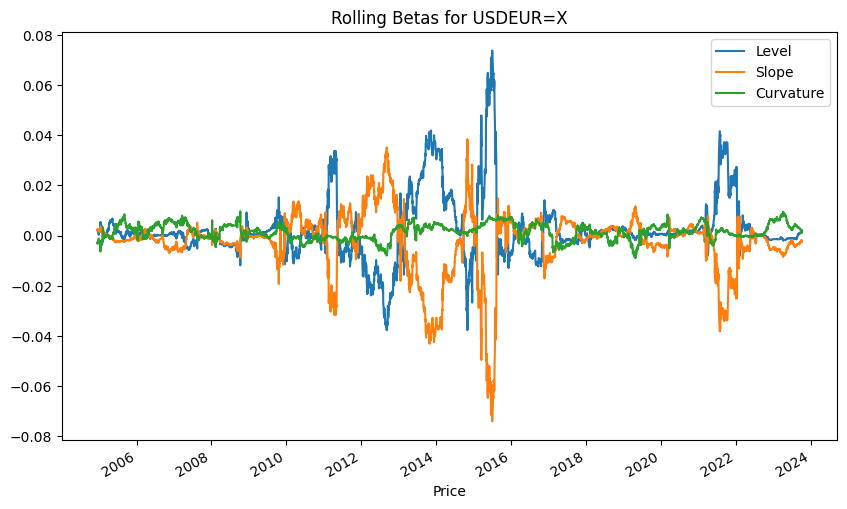

In [ ]:
window = 252  # ~1 year of daily data
rolling_betas = []

for start in range(len(combined_data)-window):
    end = start + window
    segment = combined_data.iloc[start:end]
    X_segment = sm.add_constant(segment[['Level','Slope','Curvature']])
    y_segment = segment['USDEUR=X']
    model = sm.OLS(y_segment, X_segment).fit()
    rolling_betas.append(model.params)

rolling_betas_df = pd.DataFrame(rolling_betas, index=combined_data.index[window:])
rolling_betas_df[['Level','Slope','Curvature']].plot(figsize=(10,6))
plt.title('Rolling Betas for USDEUR=X')
plt.show()

/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.531e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.53e-05. Parameter
estimation work better when this value is between 1 and 1000. The

{'USDEUR=X': 0.9393977530088736, 'USDGBP=X': 0.01231187880814674, 'USDJPY=X': 0.038293375736139675, 'USDCAD=X': 0.021947220595945446, 'USDCHF=X': -0.03190070591260806, 'USDNZD=X': -0.016907182294821316, 'USDSEK=X': 0.08871663194611974, 'USDNOK=X': -0.001097890846912492, 'USDSGD=X': 0.9393581474388234}
USDEUR=X    0
USDGBP=X    0
USDJPY=X    0
USDCAD=X    0
USDCHF=X    0
USDNZD=X    0
USDSEK=X    0
USDNOK=X    0
USDSGD=X    0
dtype: int64


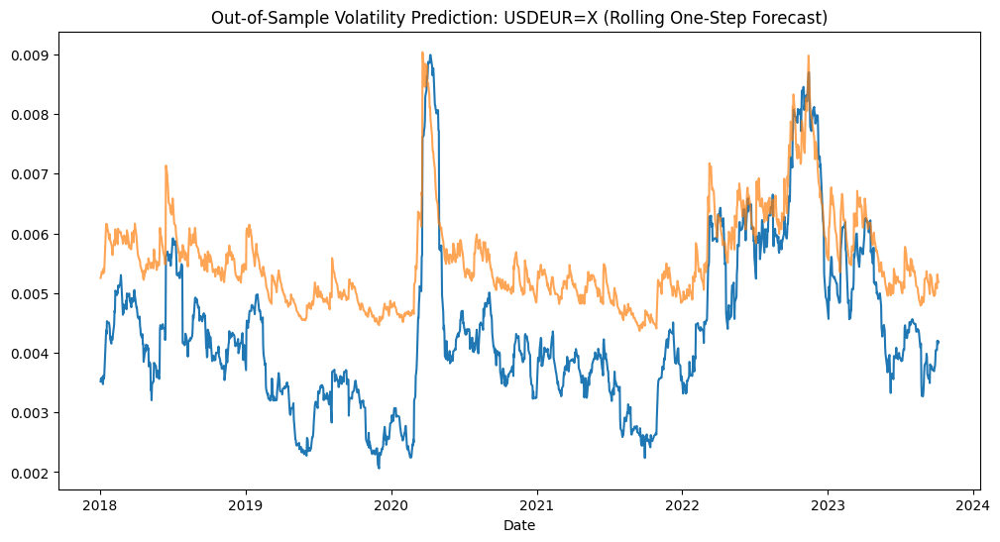

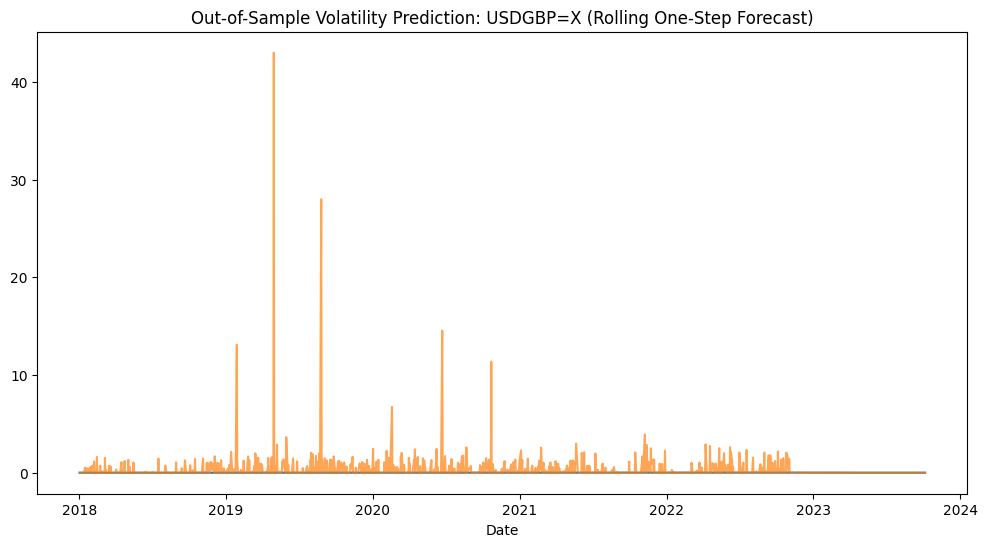

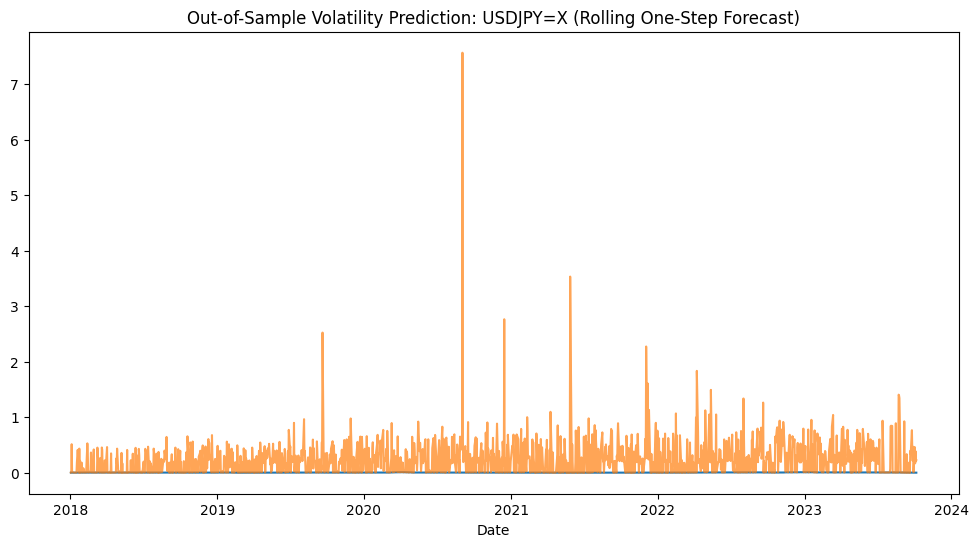

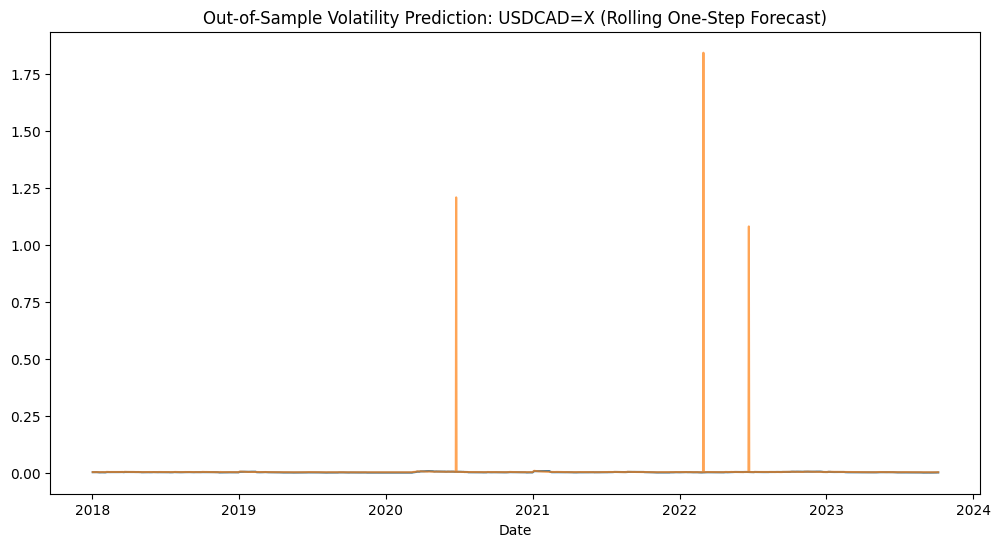

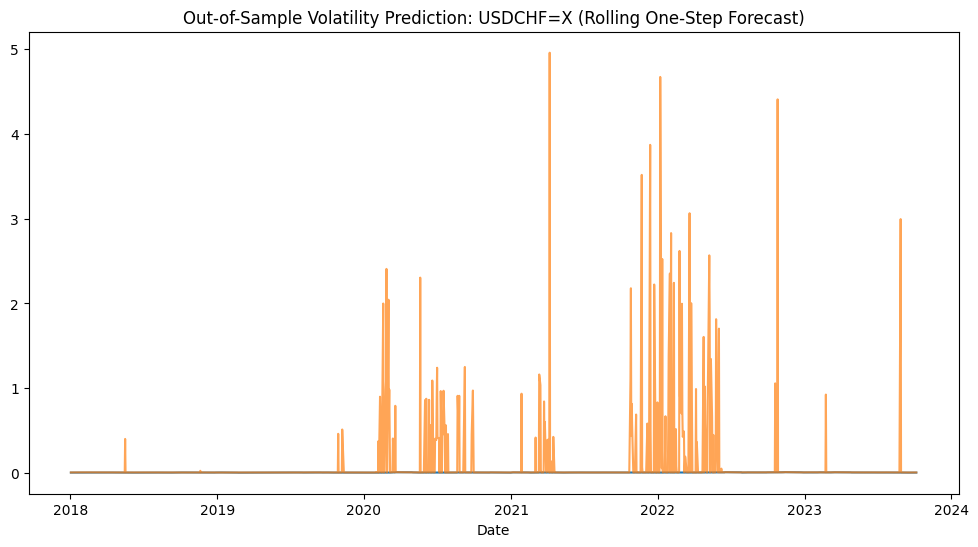

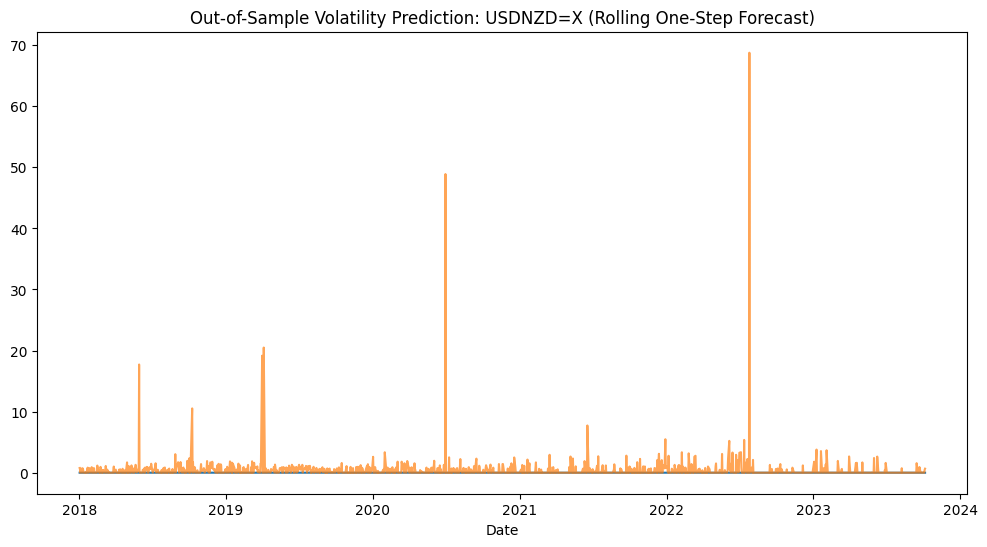

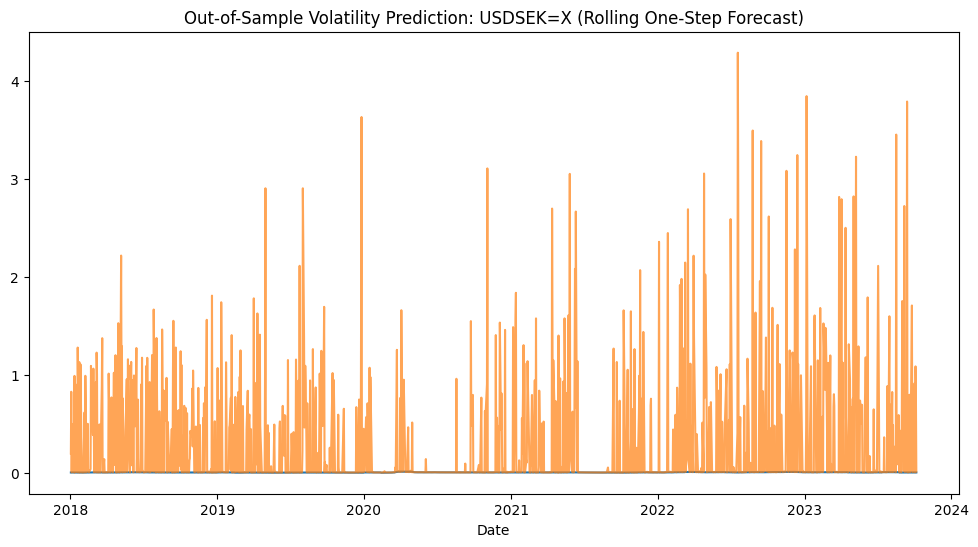

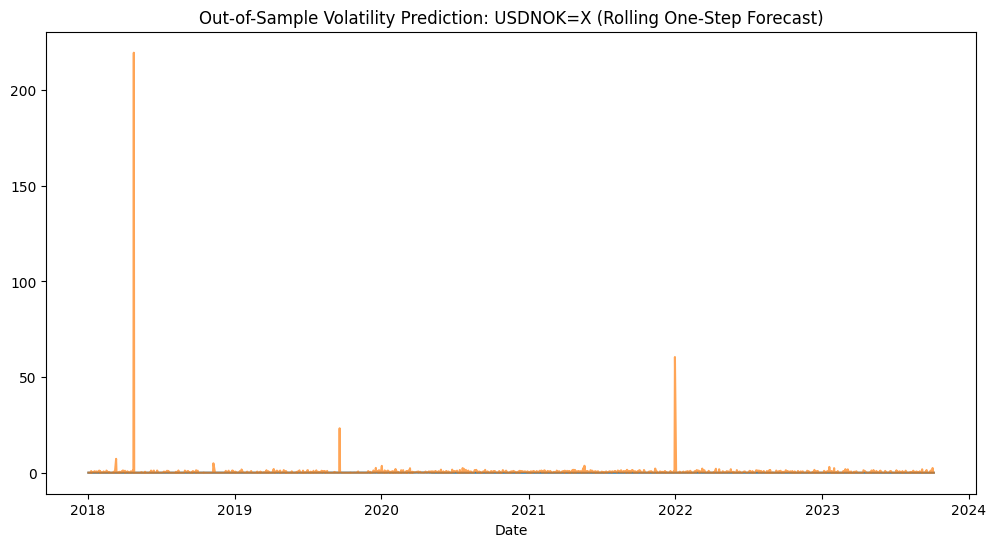

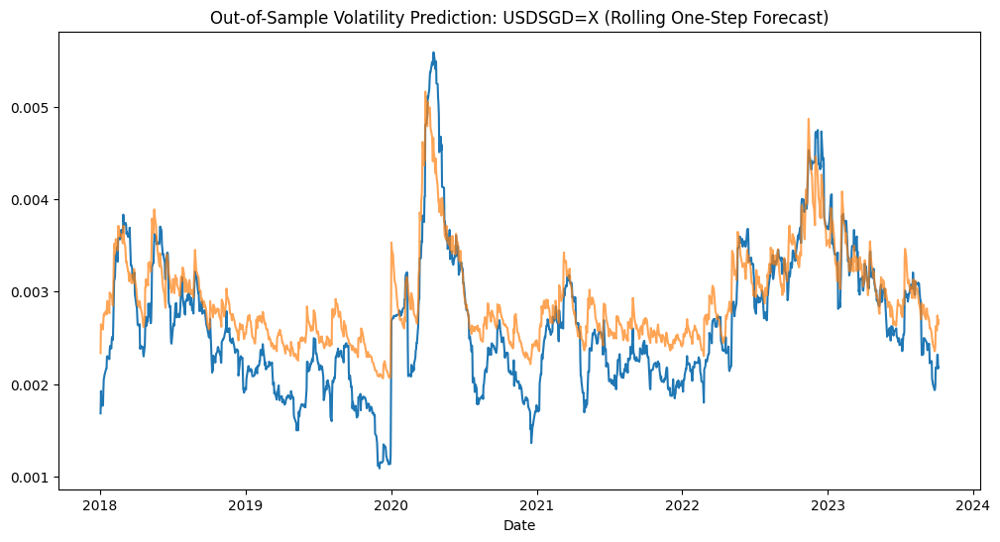

In [ ]:
prediction_horizon = 1
predicted_vol_series = []

# Start from the end of the training set and move day-by-day
# use combined_data
train_end = train_data.index[-1]
test_dates = test_data.index

y_combined = np.log(exchange_rates['USDEUR=X']).diff().dropna()

for date in test_dates:
    # Use all data up to 'date - 1' for fitting
    subset = y_combined.loc[:date]
    model = arch_model(subset, vol='GARCH', p=1, q=1)
    res = model.fit(disp='off')
    
    # One-step ahead forecast
    forecast = res.forecast(start=date, horizon=prediction_horizon, reindex=False)
    vol_forecast = np.sqrt(forecast.variance.values[-1,0])
    predicted_vol_series.append((date, vol_forecast))

predicted_vol_df = pd.DataFrame(predicted_vol_series, columns=['Date','Predicted_Vol']).set_index('Date')

# Plot side by side:
# plt.figure(figsize=(12,6))
# plt.plot(actual_vol, label='Realized Vol (30-day rolling STD)')
# remove the value for 2021-06-29  from the data
#

# predicted_vol_df = predicted_vol_df.drop(pd.to_datetime('2021-06-29'))
# print(predicted_vol_df[predicted_vol_df['Predicted_Vol'] > 0.1])  # threshold chosen based on your scale
# plt.plot(predicted_vol_df['Predicted_Vol'], label='Predicted Vol (GARCH)', alpha=0.7)
# plt.title('Out-of-Sample Volatility Prediction: USDEUR=X (Rolling One-Step Forecast)')
# plt.xlabel('Date')
# plt.ylabel('Volatility')
# plt.legend()
# plt.show()
# Suppose predicted_vol_df is your DataFrame with predicted vol

# do thsi for all the currencies, just numerically and anlyze 
# the results
corrs = {}
for currency in currency_pairs:
    predicted_vol_series = []
    y_combined = np.log(exchange_rates[currency]).diff().dropna()
    for date in test_dates:
        subset = y_combined.loc[:date]
        model = arch_model(subset, vol='GARCH', p=1, q=1, )
        res = model.fit(disp='off')
        forecast = res.forecast(start=date, horizon=prediction_horizon, reindex=False)
        vol_forecast = np.sqrt(forecast.variance.values[-1,0])
        predicted_vol_series.append((date, vol_forecast))
    predicted_vol_df = pd.DataFrame(predicted_vol_series, columns=['Date','Predicted_Vol']).set_index('Date')
    # compute the correlation between the predicted and the actual volatilities
    # for each currency
    plt.figure(figsize=(12,6))
    


    predicted_vol_df = predicted_vol_df.drop(pd.to_datetime('2021-06-29'))
    actual_vol = y_combined.rolling(window=30).std().loc[test_dates]
    correlation = actual_vol.corr(predicted_vol_df['Predicted_Vol'])
    plt.plot(actual_vol, label='Realized Vol (30-day rolling STD) for ' + currency + (f"Correlation: {correlation:.4f}"))
    plt.plot(predicted_vol_df['Predicted_Vol'], label='Predicted Vol (GARCH)', alpha=0.7)
    plt.title(f'Out-of-Sample Volatility Prediction: {currency} (Rolling One-Step Forecast)')


    plt.xlabel('Date')
    # add correlation to corrs 
    corrs[currency] = correlation
    # 
    # print(f"{currency} Correlation: {correlation:.4f}")
print(corrs)

# Check for NaNs in your data
print(fx_returns.isnull().sum())
# Check GARCH fit results
# If a particular fit didn't converge or returned odd parameters, re-run that step in isolation.

Final Return: 0.0000
Annualized Return: 0.0000
Annualized Volatility: 0.0000
Sharpe Ratio: nan


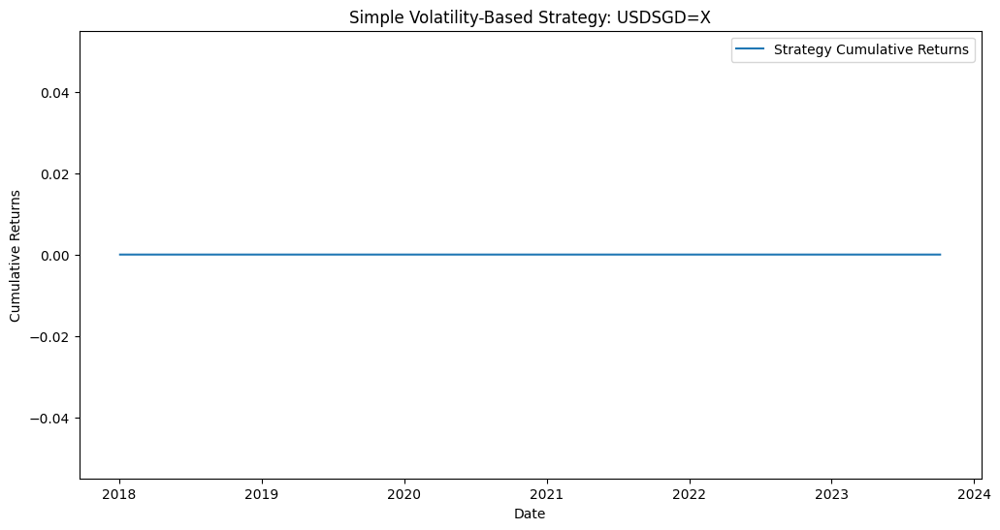

In [158]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assume you already have:
# - predicted_vol_df: DataFrame with predicted volatility for each test date
# - y_test: Series with daily log returns of target_currency over the test period
# Make sure they are aligned on the same index/dates

# 1. Align and Shift Predictions
# If your predicted_vol_df is a forecast for the same day, shift it by 1 day
# so that the forecast made at day t is used for day t+1’s trading decision.
predicted_vol_df_shifted = predicted_vol_df.shift(1)

# We must drop any NaNs introduced by shifting
predicted_vol_df_shifted = predicted_vol_df_shifted.dropna()
common_index = y_test.index.intersection(predicted_vol_df_shifted.index)
y_test = y_test.loc[common_index]
predicted_vol_df_shifted = predicted_vol_df_shifted.loc[common_index]

# 2. Define a Simple Strategy
# Let's pick a volatility threshold. If predicted vol < 0.002, go long 1 unit of currency. Otherwise 0.
threshold = 0.002  # this is arbitrary, adjust based on observed vol levels
positions = (predicted_vol_df_shifted['Predicted_Vol'] < threshold).astype(int)

# positions is now a Series of 1 or 0 for each day:
# 1 means we hold a 1-unit long position, 0 means flat.

# 3. Compute Daily PnL
# PnL is positions * daily returns. Since these are log returns,
# daily linear returns ≈ y_test. If you want to be more precise, convert log returns.
# For simplicity, assume log returns ~ percentage changes for small returns.
daily_pnl = positions * y_test

# 4. Compute Cumulative Returns
cumulative_returns = daily_pnl.cumsum()

# 5. Evaluate Strategy
final_return = cumulative_returns.iloc[-1]
annualized_return = (1 + final_return)**(252/len(cumulative_returns)) - 1  # assuming ~252 trading days per year
annualized_vol = daily_pnl.std() * np.sqrt(252)
sharpe_ratio = (daily_pnl.mean()*252) / (daily_pnl.std()*np.sqrt(252)) if daily_pnl.std() != 0 else np.nan

print(f"Final Return: {final_return:.4f}")
print(f"Annualized Return: {annualized_return:.4f}")
print(f"Annualized Volatility: {annualized_vol:.4f}")
print(f"Sharpe Ratio: {sharpe_ratio:.4f}")

# 6. Plot Cumulative Performance
plt.figure(figsize=(12,6))
plt.plot(cumulative_returns, label='Strategy Cumulative Returns')
plt.title(f'Simple Volatility-Based Strategy: {target_currency}')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.show()


DatetimeIndex(['2018-01-02', '2018-01-03', '2018-01-04', '2018-01-05',
               '2018-01-08', '2018-01-09', '2018-01-10', '2018-01-11',
               '2018-01-12', '2018-01-16',
               ...
               '2023-09-25', '2023-09-26', '2023-09-27', '2023-09-28',
               '2023-09-29', '2023-10-02', '2023-10-03', '2023-10-04',
               '2023-10-05', '2023-10-06'],
              dtype='datetime64[ns]', name='Price', length=1442, freq=None)


/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.533e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.531e-05. Parameter
estimation work better when this value is between 1 and 1000. Th

Empty DataFrame
Columns: [Predicted_Vol]
Index: []


/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 5.229e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/arch/univariate/base.py:768: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


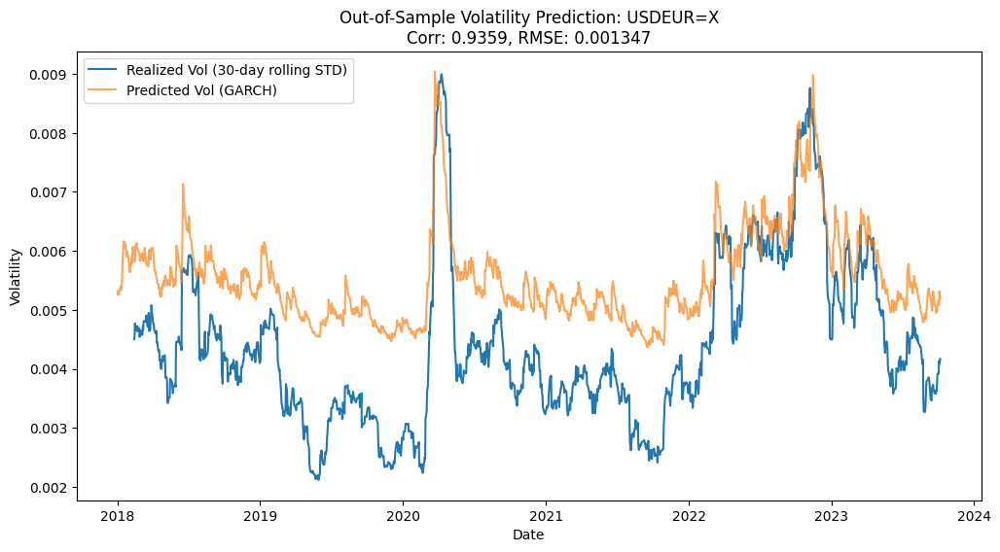

Out-of-Sample Evaluation for USDEUR=X:
Correlation between realized and predicted vol: 0.9359
RMSE: 0.001347
Final Return: 0.0847
Annualized Return: 0.0143
Annualized Volatility: 0.0724
Sharpe Ratio: 0.2048


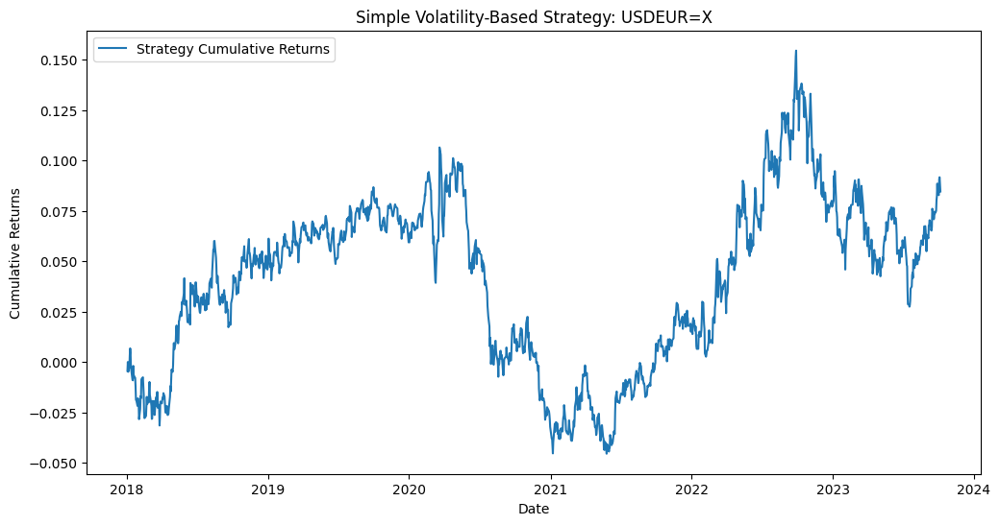

In [ ]:
target_currency = "USDEUR=X"
y_test = np.log(exchange_rates[target_currency]).diff().dropna().loc[test_data.index]

# Rolling one-step-ahead forecast:
prediction_horizon = 1
predicted_vol_series = []

print(y_test.index)


# drop the date ('2021-06-29')) from the index
y_test = y_test.drop('2021-06-29')
y_test = y_test.drop('2021-06-30')
for date in y_test.index:
    subset = np.log(exchange_rates[target_currency]).diff().dropna().loc[:date]
    subset = subset.iloc[:-1]  # ensure we're forecasting out-of-sample
    if len(subset) < 200:
        continue  # not enough data to fit GARCH reliably

    model = arch_model(subset, vol='GARCH', p=1, q=1)
    res = model.fit(disp='off')

    # One-step ahead forecast without specifying start
    forecast = res.forecast(horizon=1, reindex=False)
    
    # Check if forecast is empty
    if forecast.variance.values.size == 0:
        print(f"No forecast available for {date}, skipping.")
        continue
    vol_forecast = np.sqrt(forecast.variance.values[-1,0])
    predicted_vol_series.append((date, vol_forecast))

predicted_vol_df = pd.DataFrame(predicted_vol_series, columns=['Date','Predicted_Vol']).set_index('Date')
outliers = predicted_vol_df[predicted_vol_df['Predicted_Vol'] > 0.1]  # or another suitable threshold
print(outliers)

# Compute realized volatility as rolling STD of returns in the test set
realized_vol = y_test.rolling(window=30).std()

# Align indexes
common_index = realized_vol.index.intersection(predicted_vol_df.index)
realized_vol = realized_vol.loc[common_index]
predicted_vol_df = predicted_vol_df.loc[common_index]

# Evaluate Performance
corr = realized_vol.corr(predicted_vol_df['Predicted_Vol'])
rmse = math.sqrt(mean_squared_error(realized_vol.dropna(), predicted_vol_df.loc[realized_vol.dropna().index, 'Predicted_Vol']))

# Plot out-of-sample comparison
plt.figure(figsize=(12,6))
plt.plot(realized_vol, label='Realized Vol (30-day rolling STD)')
plt.plot(predicted_vol_df['Predicted_Vol'], label='Predicted Vol (GARCH)', alpha=0.7)
plt.title(f'Out-of-Sample Volatility Prediction: {target_currency}\nCorr: {corr:.4f}, RMSE: {rmse:.6f}')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()


print(f"Out-of-Sample Evaluation for {target_currency}:")
print(f"Correlation between realized and predicted vol: {corr:.4f}")
print(f"RMSE: {rmse:.6f}")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assume you already have:
# - predicted_vol_df: DataFrame with predicted volatility for each test date
# - y_test: Series with daily log returns of target_currency over the test period
# Make sure they are aligned on the same index/dates

# 1. Align and Shift Predictions
# If your predicted_vol_df is a forecast for the same day, shift it by 1 day
# so that the forecast made at day t is used for day t+1’s trading decision.
predicted_vol_df_shifted = predicted_vol_df.shift(1)

# We must drop any NaNs introduced by shifting
predicted_vol_df_shifted = predicted_vol_df_shifted.dropna()
common_index = y_test.index.intersection(predicted_vol_df_shifted.index)
y_test = y_test.loc[common_index]
predicted_vol_df_shifted = predicted_vol_df_shifted.loc[common_index]

# 2. Define a Simple Strategy
# Let's pick a volatility threshold. If predicted vol < 0.002, go long 1 unit of currency. Otherwise 0.
threshold = 0.01  # this is arbitrary, adjust based on observed vol levels
positions = (predicted_vol_df_shifted['Predicted_Vol'] < threshold).astype(int)

# positions is now a Series of 1 or 0 for each day:
# 1 means we hold a 1-unit long position, 0 means flat.

# 3. Compute Daily PnL
# PnL is positions * daily returns. Since these are log returns,
# daily linear returns ≈ y_test. If you want to be more precise, convert log returns.
# For simplicity, assume log returns ~ percentage changes for small returns.
daily_pnl = positions * y_test

# 4. Compute Cumulative Returns
cumulative_returns = daily_pnl.cumsum()

# 5. Evaluate Strategy
final_return = cumulative_returns.iloc[-1]
annualized_return = (1 + final_return)**(252/len(cumulative_returns)) - 1  # assuming ~252 trading days per year
annualized_vol = daily_pnl.std() * np.sqrt(252)
sharpe_ratio = (daily_pnl.mean()*252) / (daily_pnl.std()*np.sqrt(252)) if daily_pnl.std() != 0 else np.nan

print(f"Final Return: {final_return:.4f}")
print(f"Annualized Return: {annualized_return:.4f}")
print(f"Annualized Volatility: {annualized_vol:.4f}")
print(f"Sharpe Ratio: {sharpe_ratio:.4f}")

# 6. Plot Cumulative Performance
plt.figure(figsize=(12,6))
plt.plot(cumulative_returns, label='Strategy Cumulative Returns')
plt.title(f'Simple Volatility-Based Strategy: {target_currency}')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.legend()
plt.show()
